<a href="https://colab.research.google.com/github/nikhilgang/DEEP-LEARNING/blob/master/Tensorflow_2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>

![alt text](https://www.leadingindia.ai/images/newimages/Leading-india-logo.png)
  
 </center>

# General Instructions


*   Connect to Colab runtime environment by clicking *Connect* on top right
*   For hardware acceleration, select *Runtime*, then select *Change Runtime Type*, next select appropriate hardware accelerator i.e., *GPU* or *TPU* and finally select *OK*
*   To execute a cell, select the cell and press *shift + enter*. Alternatively you can also select the cell then select *Runtime* then select *Run the focused cell*
*    To run all the notebook code cells: Select *Runtime* then select  *Run all.*
*  To view difference keyboard shortcus: Select *Tools* then select *Keyboard shortcuts*
*  Some important keyboard shortcuts are:
    * **Shift+Enter** - To execute current cell
    * **Tab** - To autocomplete current command
    *  **alt + /** - To see the documention corresonding to a built in function
*  To execute any Linux terminal (Bash) command in Colab simply type <font color=red>**!** </font>
followed by the command


In [1]:
!date

Wed Mar  4 11:58:46 UTC 2020


* To execute entire cell as Bash script use <font color=red>**%%** </font> at the starting of cell

In [2]:
%%shell
mkdir test
ls

sample_data  test


* Golden rule of Jupyter Notebook including Google Colab - Execute each and every cell from top to bottom 
*  <font color=red>**Major Limitation of Colab**</font> - Data stored is not persistent. Data is deleted everytime we reset Colab or after continous execution gor 12 hours. <font color=blue>**Solution**</font> - use Google Drive along with Colab
* Best resource for Tensorflow 2.x - www.tensorflow.org/alpha , [Tensorflow Youtube channel](https://www.youtube.com/channel/UC0rqucBdTuFTjJiefW5t-IQ)
*  To learn more about AI, Machine Learning, Deep Learning or Deep Reinforcement Learning - www.leadingindia.ai


##1. Quick Dive Into Tensorflow 2.x


To start working with Tensorflow 2.x we need to install it in colab (using python utility pip) by executing following command:

In [1]:
!pip install tensorflow-gpu==2.0.0-beta

Importing necessary modules

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals #forces Python interpreter to use newer features of the language.
import tensorflow as tf

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

Checking the Tensorflow version

In [3]:
print(tf.__version__)

2.0.0-beta0


With the release of Tensorflow 2.x, <font color=red>the officially supported higher level API is **Keras** accessible via tf.keras</font>. Initially various APIs were distributed all across Tensorflow. However, now these duplicated and distributed API are all consolidated as:

1.   [**tf.keras.optimizers**](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/optimizers) - various optimizers for machine learning algorithms like ADAM, RMSprop etc
2.  [**tf.keras.metrics** ](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/metrics)- various metrics for judging the goodness of model
3.  **[tf.keras.losses](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses)**  - to reduce the error in prediction during the optimization process
4. **[tf.keras.layers](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers)** - various layers for building Deep Neural Networks like Conv1D,  Dense, Dropout, Embedding, GRU etc

For exploring <u> tf.keras</u> higher level API [click here](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras)

## 1.1 Classifying Handwritten Digits using tf.keras Higher Level API:
<center>
  
  
![MNIST Dataset](https://upload.wikimedia.org/wikipedia/commons/2/27/MnistExamples.png)


</center>


Load and prepare the [MNIST dataset](http://yann.lecun.com/exdb/mnist/). Convert the samples from integers to floating-point numbers:

In [6]:
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0 #normalizing input

11493376/11490434 [==============================] - 0s 0us/step


Finding the shape of x_train, x_test, y_train and y_test

In [7]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(60000, 28, 28)
(60000,)
(10000, 28, 28)
(10000,)


Create a Sequential Model using tf.keras.layers

In [0]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

Training and evaluating the model

In [9]:
model.fit(x_train, y_train, epochs=5)

model.evaluate(x_test, y_test)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 60000 samples
Epoch 1/5
60000/60000 [==============================] - 8s 128us/sample - loss: 0.2886 - accuracy: 0.9161
Epoch 2/5
60000/60000 [==============================] - 6s 94us/sample - loss: 0.1426 - accuracy: 0.9578
Epoch 3/5
60000/60000 [==============================] - 6s 94us/sample - loss: 0.1071 - accuracy: 0.9677
Epoch 4/5
60000/60000 [==============================] - 6s 99us/sample - loss: 0.0896 - accuracy: 0.9723
Epoch 5/5
10000/10000 [==============================] - 1s 54us/sample - loss: 0.0735 - accuracy: 0.9784


[0.07345317563759163, 0.9784]

## Challenge 1.1.1 Change optimizer, loss, metrics of the above model by exploring [tf.keras](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras) API



In [0]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='RMSprop', 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy']
             )

In [22]:
model.fit(x_train, y_train, epochs=5)

model.evaluate(x_test, y_test)

Train on 60000 samples
Epoch 1/5
60000/60000 [==============================] - 6s 102us/sample - loss: 0.2967 - accuracy: 0.9142
Epoch 2/5
60000/60000 [==============================] - 6s 102us/sample - loss: 0.1570 - accuracy: 0.9538
Epoch 3/5
60000/60000 [==============================] - 6s 99us/sample - loss: 0.1246 - accuracy: 0.9644
Epoch 4/5
60000/60000 [==============================] - 6s 98us/sample - loss: 0.1113 - accuracy: 0.9691
Epoch 5/5
10000/10000 [==============================] - 1s 57us/sample - loss: 0.1022 - accuracy: 0.9734


[0.10218349893712439, 0.9734]

## Challenge 1.1.2 Create a Deep Learning Model to predict housing prices using the built-in [Boston Housing](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/datasets/boston_housing) dataset of [tf.keras](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras) API

### Load Dataset

In [0]:
#Load Dataset
boston = tf.keras.datasets.boston_housing
#(x_train, y_train), (x_test, y_test) = boston.load_data()#Use in builtin method to load data

In [0]:
from keras.datasets import boston_housing

In [32]:
(x_train, y_train), (x_test, y_test) = boston_housing.load_data()

57344/57026 [==============================] - 0s 3us/step


In [33]:
print(x_train.shape)

(404, 13)


In [0]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(13, input_shape=(13, ), activation='relu'),
  tf.keras.layers.Dense(6, activation='relu'),
  tf.keras.layers.Dense(1,activation='softmax')
])

### Create model as per following specifications using tf.keras  and compile it:<br>
Dense Layer -> 13 hidden units, input shape =13, activation = relu<br>
Dense Layer -> 6 hidden units, activation = relu<br>
Dense Layer -> 1 hidden unit<br>
Optimizer ->sgd,  loss-> Mean squared error,metrics -> accuracy  

In [0]:
model.compile(optimizer='SGD', 
              loss='mean_squared_error',
              metrics=['accuracy']
             )

In [41]:
model.fit(x_train, y_train, epochs=10)

model.evaluate(x_test, y_test)

Train on 404 samples
Epoch 1/10
404/404 [==============================] - 0s 203us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 2/10
404/404 [==============================] - 0s 59us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 3/10
404/404 [==============================] - 0s 65us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 4/10
404/404 [==============================] - 0s 69us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 5/10
404/404 [==============================] - 0s 60us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 6/10
404/404 [==============================] - 0s 60us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 7/10
404/404 [==============================] - 0s 64us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 8/10
404/404 [==============================] - 0s 60us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 9/10
404/404 [==============================] - 0s 56us/sample - loss: 542.3704 - accuracy: 0.0000e+

[570.7009983436734, 0.0]

### Training  and evaluating the model

In [42]:
#no changes need to be done here
print(x_train.shape)
print(y_train.shape)
model.fit(x_train, y_train, epochs=50)
model.evaluate(x_test, y_test)

(404, 13)
(404,)
Train on 404 samples
Epoch 1/50
404/404 [==============================] - 0s 80us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 2/50
404/404 [==============================] - 0s 84us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 3/50
404/404 [==============================] - 0s 78us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 4/50
404/404 [==============================] - 0s 80us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 5/50
404/404 [==============================] - 0s 76us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 6/50
404/404 [==============================] - 0s 71us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 7/50
404/404 [==============================] - 0s 67us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 8/50
404/404 [==============================] - 0s 59us/sample - loss: 542.3704 - accuracy: 0.0000e+00
Epoch 9/50
404/404 [==============================] - 0s 64us/sample - loss: 542.3704 - ac

[570.7009983436734, 0.0]

### Making Predictions using model

In [43]:
print('Predicted Price {}'.format(model.predict(x_test[20].reshape(-1,13))))#to convert 2 dimensional matrix x_test to single dimensional vector having 13 elements
print('Actual Price {}'.format(y_test[20]))

Predicted Price [[1.]]
Actual Price 12.0


## 1.2 Classifying images using CNN in TensorFlow 2.x


*   There are multiple datasets available in TensorFlow 2.x via  
      *   [tf.keras.datasets](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/datasets) - Relatively simple datasets. Limited in numbers.
      * [Tensorflow Datasets](https://www.tensorflow.org/datasets/datasets) - A large collection of quality datasets that can be used for testing state of the art model
      
Displaying list of available datasets available



In [6]:
import tensorflow_datasets as tfds
print(tfds.list_builders())

['abstract_reasoning', 'aflw2k3d', 'amazon_us_reviews', 'bair_robot_pushing_small', 'bigearthnet', 'binarized_mnist', 'binary_alpha_digits', 'caltech101', 'caltech_birds2010', 'caltech_birds2011', 'cats_vs_dogs', 'celeb_a', 'celeb_a_hq', 'chexpert', 'cifar10', 'cifar100', 'cifar10_corrupted', 'clevr', 'cnn_dailymail', 'coco', 'coco2014', 'coil100', 'colorectal_histology', 'colorectal_histology_large', 'curated_breast_imaging_ddsm', 'cycle_gan', 'deep_weeds', 'definite_pronoun_resolution', 'diabetic_retinopathy_detection', 'downsampled_imagenet', 'dsprites', 'dtd', 'dummy_dataset_shared_generator', 'dummy_mnist', 'emnist', 'eurosat', 'fashion_mnist', 'flores', 'food101', 'gap', 'glue', 'groove', 'higgs', 'horses_or_humans', 'image_label_folder', 'imagenet2012', 'imagenet2012_corrupted', 'imdb_reviews', 'iris', 'kitti', 'kmnist', 'lfw', 'lm1b', 'lsun', 'mnist', 'mnist_corrupted', 'moving_mnist', 'multi_nli', 'nsynth', 'omniglot', 'open_images_v4', 'oxford_flowers102', 'oxford_iiit_pet', 

Loading Flowers Dataset:

In [46]:
!pip install tensorflow-datasets==1.2.0

     |████████████████████████████████| 2.3MB 8.9MB/s 
  Found existing installation: tensorflow-datasets 2.0.0
    Uninstalling tensorflow-datasets-2.0.0:
      Successfully uninstalled tensorflow-datasets-2.0.0


In [0]:
import tensorflow

In [8]:
SPLIT_WEIGHTS = (8, 1, 1)#Splitting the dataset into Train, Validation and Test Set
splits = tfds.Split.TRAIN.subsplit(weighted=SPLIT_WEIGHTS)
(raw_train, raw_validation, raw_test), metadata = tfds.load(name="tf_flowers", 
                                                            with_info=True,
                                                            split=list(splits),
# as_supervised: `bool`, if `True`, the returned `tf.data.Dataset`
# will have a 2-tuple structure `(input, label)`                                                            
                                                            as_supervised=True)























                                                            

Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/1.0.0. Subsequent calls will reuse this data.


Let us explore the dataset

In [9]:
print(metadata)

tfds.core.DatasetInfo(
    name='tf_flowers',
    version=1.0.0,
    description='A large set of images of flowers',
    urls=['http://download.tensorflow.org/example_images/flower_photos.tgz'],
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    total_num_examples=3670,
    splits={
        'train': 3670,
    },
    supervised_keys=('image', 'label'),
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
    redistribution_info=,
)



Preprocessing the Images:


*   Converting the images to 128*128 size
*   Normalizing images



In [10]:
IMG_SIZE = 128
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
def format_example(image, label):
    print("Format example called!")
    image = tf.cast(image, tf.float32)
    image = image / 255.0
    # Resize the image if required
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

Format example called!
Format example called!
Format example called!


Shuffling the training images and creating batch of images for efficient training and testing

In [11]:
SHUFFLE_BUFFER_SIZE = 1024
BATCH_SIZE = 32

train = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation = validation.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)
# (Optional) prefetch will enable the input pipeline to asynchronously fetch batches while
# your model is training.
train = train.prefetch(tf.data.experimental.AUTOTUNE)
print(train)
print(validation)
print(test)

<PrefetchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>
<BatchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>
<BatchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>


Visualizing the Dataset

(128, 128, 3)
0.0
0.9997702


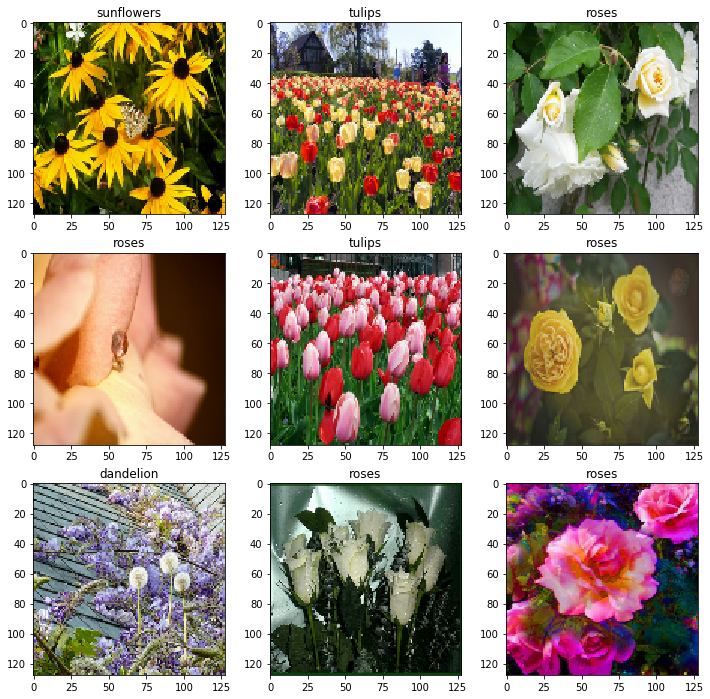

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
# Get the function which converts label indices to string
get_label_name = metadata.features['label'].int2str
plt.figure(figsize=(12,12)) 
for batch in train.take(1):
    for i in range(9):
        image, label = batch[0][i], batch[1][i]
        plt.subplot(3,3,i+1)
        plt.imshow(image.numpy())
        plt.title(get_label_name(label.numpy()))
        plt.grid(False)
print(image.shape)
print(np.min(image))
print(np.max(image))

Creating a CNN model to classify images

In [0]:
# Creating a simple CNN model in tf.keras using functional API
def create_model():
  model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
  tf.keras.layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dense(metadata.features['label'].num_classes, activation='softmax')
  ])
  return model
num_train, num_val, num_test = (metadata.splits['train'].num_examples * weight/10 for weight in SPLIT_WEIGHTS)
steps_per_epoch = round(num_train)//BATCH_SIZE
validation_steps = round(num_val)//BATCH_SIZE
model = create_model()

Building the model and training it

In [15]:
model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

model.fit(train.repeat(), epochs=10,  steps_per_epoch=steps_per_epoch, validation_data=validation.repeat(), validation_steps=validation_steps,)

Epoch 1/10
91/91 [==============================] - 9s 103ms/step - loss: 0.4805 - accuracy: 0.8197 - val_loss: 1.0900 - val_accuracy: 0.6364
Epoch 2/10
91/91 [==============================] - 9s 97ms/step - loss: 0.3072 - accuracy: 0.8960 - val_loss: 1.3128 - val_accuracy: 0.5966
Epoch 3/10
91/91 [==============================] - 9s 95ms/step - loss: 0.1921 - accuracy: 0.9373 - val_loss: 1.4931 - val_accuracy: 0.6222
Epoch 4/10
91/91 [==============================] - 9s 97ms/step - loss: 0.1083 - accuracy: 0.9671 - val_loss: 1.7629 - val_accuracy: 0.6051
Epoch 5/10
91/91 [==============================] - 9s 94ms/step - loss: 0.0727 - accuracy: 0.9816 - val_loss: 1.8319 - val_accuracy: 0.5938
Epoch 6/10
91/91 [==============================] - 9s 94ms/step - loss: 0.0517 - accuracy: 0.9858 - val_loss: 2.1275 - val_accuracy: 0.5881
Epoch 7/10
91/91 [==============================] - 8s 93ms/step - loss: 0.0530 - accuracy: 0.9865 - val_loss: 1.7999 - val_accuracy: 0.6023
Epoch 8/10
9

In [16]:
model.evaluate(x_test, y_test)

NameError: ignored

## Challenge 1.3 Create a CNN based model in Tensorflow 2.x to classify whether a given image is of human or horse using tf.Dataset - [Horses Or Humans](https://www.tensorflow.org/datasets/datasets#horses_or_humans)


*   First Explore the dataset by [clicking here](http://www.laurencemoroney.com/horses-or-humans-dataset/)






In [17]:
SPLIT_WEIGHTS = (8, 1, 1)#Splitting the dataset into Train, Validation and Test Set
splits = tfds.Split.TRAIN.subsplit(weighted=SPLIT_WEIGHTS)
(raw_train, raw_validation, raw_test), metadata = tfds.load(name="horses_or_humans", 
                                                            with_info=True,
                                                            split=list(splits),
# as_supervised: `bool`, if `True`, the returned `tf.data.Dataset`
# will have a 2-tuple structure `(input, label)`                                                            
                                                            as_supervised=True)

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)
/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


Dataset horses_or_humans downloaded and prepared to /root/tensorflow_datasets/horses_or_humans/1.0.0. Subsequent calls will reuse this data.


In [18]:
IMG_SIZE = 128
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
def format_example(image, label):
    print("Format example called!")
    image = tf.cast(image, tf.float32)
    image = image / 255.0
    # Resize the image if required
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

Format example called!
Format example called!
Format example called!


In [19]:
SHUFFLE_BUFFER_SIZE = 1024
BATCH_SIZE = 32

train = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation = validation.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)
# (Optional) prefetch will enable the input pipeline to asynchronously fetch batches while
# your model is training.
train = train.prefetch(tf.data.experimental.AUTOTUNE)
print(train)
print(validation)
print(test)

<PrefetchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>
<BatchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>
<BatchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>


(128, 128, 3)
0.035499964
1.0


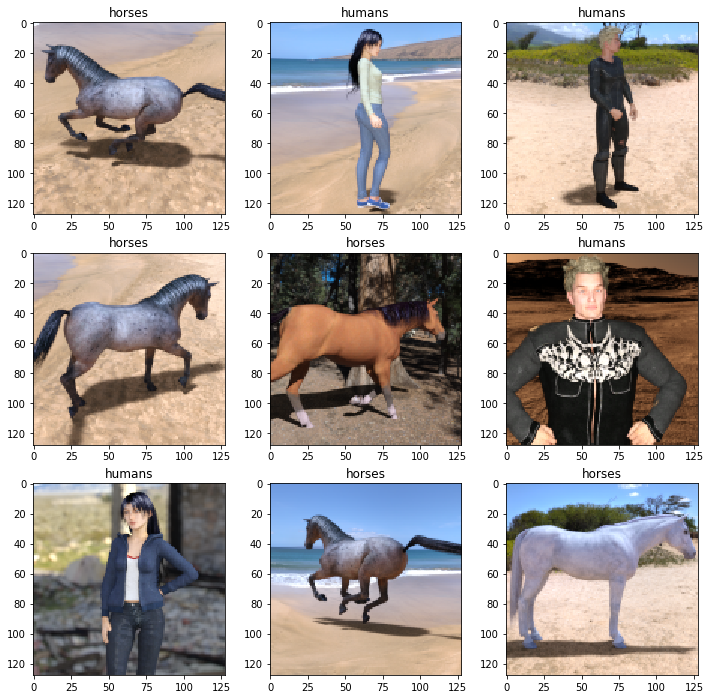

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
# Get the function which converts label indices to string
get_label_name = metadata.features['label'].int2str
plt.figure(figsize=(12,12)) 
for batch in train.take(1):
    for i in range(9):
        image, label = batch[0][i], batch[1][i]
        plt.subplot(3,3,i+1)
        plt.imshow(image.numpy())
        plt.title(get_label_name(label.numpy()))
        plt.grid(False)
print(image.shape)
print(np.min(image))
print(np.max(image))

In [0]:
# Creating a simple CNN model in tf.keras using functional API
def create_model():
  model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
  tf.keras.layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dense(metadata.features['label'].num_classes, activation='softmax')
  ])
  return model
num_train, num_val, num_test = (metadata.splits['train'].num_examples * weight/10 for weight in SPLIT_WEIGHTS)
steps_per_epoch = round(num_train)//BATCH_SIZE
validation_steps = round(num_val)//BATCH_SIZE
model = create_model()

In [23]:
model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

model.fit(train.repeat(), epochs=5,  steps_per_epoch=steps_per_epoch, validation_data=validation.repeat(), validation_steps=validation_steps,)

Epoch 1/5
25/25 [==============================] - 5s 219ms/step - loss: 0.4061 - accuracy: 0.9062 - val_loss: 0.0764 - val_accuracy: 0.9583
Epoch 2/5
25/25 [==============================] - 5s 198ms/step - loss: 0.0276 - accuracy: 0.9887 - val_loss: 0.0121 - val_accuracy: 1.0000
Epoch 3/5
25/25 [==============================] - 5s 196ms/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 0.0245 - val_accuracy: 0.9896
Epoch 4/5
25/25 [==============================] - 5s 195ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0276 - val_accuracy: 0.9896
Epoch 5/5
25/25 [==============================] - 5s 197ms/step - loss: 6.0754e-04 - accuracy: 1.0000 - val_loss: 0.0131 - val_accuracy: 0.9896


## 2. Major changes in Tensorflow 2.x when compared to Tensorflow 1.x



* Not directly backward compatible  
*  **No redundant APIs**- Many redundant APIs (e.g., tf.contrib etc) are removed so as to provide a consistent and unified interface to build machine learning models 
*   **Eager execution**: The earlier complex process of creating sessions and providing input and output tensors each time we want to train our model  is now replaced by eager execution. In short, we can get output as soon as we write code without waiting for complex graph(s) to build
* **No more sessions:** There is no need to create session.run() so as to call a function. We can simply call a function just like normal Python<br>
\# TensorFlow 1.X<br>
outputs = session.run(f(placeholder), feed_dict={placeholder: input})<br>
\# TensorFlow 2.x<br>
outputs = f(input)<br>
* **Export to SavedModel** - interchange format that can be used TensorFlow
Serving, TensorFlow Lite, TensorFlow.js, TensorFlow Hub, and more
*  **[TensorFlow Hub](https://tfhub.dev/)** - Programmers can use models from TensorFlow Hub, a library for reusable parts of machine learning models to train a Keras or Estimator model
* **tf.function and Autograph**
* **tf.data** - To build scalable pipelines


##3. Migrating Tensorflow 1.x code to Tensorflow 2.x

**Option 1: Use the Tensorflow compat module**
*   It is still possible (mostly) to run Tensorflow 1.x code in Tensorflow 2.x 

```
import tensorflow.compat.v1 as tf     #compatibility module
tf.disable_v2_behavior()
```

*   But if we use Tensorflow in compatibility mode then we cannot use the features introduced in Tensorflow 2.x


**Option 2: Use the built-in upgrade script**



*   The upgrade script will try to upgrade your Tensorflow 1.x code to Tensorflow 2.x but there is no guarantee
*   Also using the upgrade script will not update your code to recommended style in Tensorflow 2.x


Let us download a Tensorflow 1.x code:




In [0]:
!wget https://raw.githubusercontent.com/anubhavpatrick/Advanced-Deep-Learning-Workshop/master/tensorflow_old.py

--2019-05-31 04:37:25--  https://raw.githubusercontent.com/anubhavpatrick/Advanced-Deep-Learning-Workshop/master/tensorflow_old.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2998 (2.9K) [text/plain]
Saving to: ‘tensorflow_old.py’

tensorflow_old.py   100%[===================>]   2.93K  --.-KB/s    in 0s      

2019-05-31 04:37:26 (82.3 MB/s) - ‘tensorflow_old.py’ saved [2998/2998]



Exploring the downloaded Tensorflow 1.x file

In [0]:
!cat tensorflow_old.py



from __future__ import print_function

# Import MNIST data
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("/tmp/data/", one_hot=True)

import tensorflow as tf

# Parameters
learning_rate = 0.1
num_steps = 500
batch_size = 128
display_step = 100

# Network Parameters
n_hidden_1 = 256 # 1st layer number of neurons
n_hidden_2 = 256 # 2nd layer number of neurons
num_input = 784 # MNIST data input (img shape: 28*28)
num_classes = 10 # MNIST total classes (0-9 digits)

# tf Graph input
X = tf.placeholder("float", [None, num_input])
Y = tf.placeholder("float", [None, num_classes])

# Store layers weight & bias
weights = {
    'h1': tf.Variable(tf.random_normal([num_input, n_hidden_1])),
    'h2': tf.Variable(tf.random_normal([n_hidden_1, n_hidden_2])),
    'out': tf.Variable(tf.random_normal([n_hidden_2, num_classes]))
}
biases = {
    'b1': tf.Variable(tf.random_normal([n_hidden_1])),
    'b2': tf.Variable(tf.random_normal([n_hidden_2])),
    '

In [0]:
!tf_upgrade_v2 --infile tensorflow_old.py --outfile tensorflow_new.py

INFO line 24:4: Renamed 'tf.placeholder' to 'tf.compat.v1.placeholder'
INFO line 25:4: Renamed 'tf.placeholder' to 'tf.compat.v1.placeholder'
INFO line 29:22: Renamed 'tf.random_normal' to 'tf.random.normal'
INFO line 30:22: Renamed 'tf.random_normal' to 'tf.random.normal'
INFO line 31:23: Renamed 'tf.random_normal' to 'tf.random.normal'
INFO line 34:22: Renamed 'tf.random_normal' to 'tf.random.normal'
INFO line 35:22: Renamed 'tf.random_normal' to 'tf.random.normal'
INFO line 36:23: Renamed 'tf.random_normal' to 'tf.random.normal'
INFO line 55:10: Added keywords to args of function 'tf.reduce_mean'
INFO line 55:25: Changing labels arg of tf.nn.softmax_cross_entropy_with_logits to tf.stop_gradient(labels). Please check this transformation.

INFO line 57:12: Renamed 'tf.train.AdamOptimizer' to 'tf.compat.v1.train.AdamOptimizer'
INFO line 61:24: Added keywords to args of function 'tf.argmax'
INFO line 61:50: Added keywords to args of function 'tf.argmax'
INFO line 62:11: Added keywords t

To view Tensorflow 2.x converted file execute following cell:

In [0]:
!cat tensorflow_new.py

**Option 3: Manually convert Tensorflow 1.x code to Tensorflow 2.x using [guide provided by tensorflow.org](https://www.tensorflow.org/alpha/guide/migration_guide)**

## 4. Tensorflow Estimators


*   **[TF Estimator](https://www.tensorflow.org/alpha/tutorials/estimators/premade_estimators)** is another high level API for machine learning similar to tf.keras
*   Both TF Estimator and tf.keras can accomplish many of the same tasks
* As per creators of Tensorflow, TF Estimator API is less preferred over tf.keras API
* There are [several prebuilt estimators ](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/estimator)such as:
 * **tf.estimator.DNNClassifier** for deep models that perform multi-class classification.
 * **tf.estimator.DNNLinearCombinedClassifier** for wide & deep models.
 * **tf.estimator.LinearClassifier** for classifiers based on linear models.
* Steps for developing TF Estimator model


1.   Acquire the data and create the input functions
2. Create the feature column(s)
3. Instantiate the Estimator
4.Evaluate the model's performance

## 4.1 Acquire The Data and Create Input Functions


*   We will be utilizing famous [Iris Dataset](https://archive.ics.uci.edu/ml/datasets/iris)
*   This dataset is an example of multilabel classification problem
* For each sample there are 4 attributes
  * sepal length in cm 
  * sepal width in cm 
  * petal length in cm 
  * petal width in cm 
* Each sample belongs to one of the three classes
  * Iris Setosa 
  * Iris Versicolour 
  * Iris Virginica







Acquiring the data

In [24]:
#additional import required
import pandas as pd

#specifiying the column names of the dataset
CSV_COLUMN_NAMES = ['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Species']
SPECIES = ['Setosa', 'Versicolor', 'Virginica']

#downloading the dataset
!wget https://storage.googleapis.com/download.tensorflow.org/data/iris_training.csv
!wget https://storage.googleapis.com/download.tensorflow.org/data/iris_test.csv
  
  
#Reading from csv files
train = pd.read_csv('iris_training.csv', names=CSV_COLUMN_NAMES, header=0)
test = pd.read_csv('iris_test.csv', names=CSV_COLUMN_NAMES, header=0)

#displaying the contents of the dataset just read
train.head()

--2020-03-04 13:06:00--  https://storage.googleapis.com/download.tensorflow.org/data/iris_training.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.127.128, 2a00:1450:4013:c07::80
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.127.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2194 (2.1K) [text/csv]
Saving to: ‘iris_training.csv’

iris_training.csv   100%[===================>]   2.14K  --.-KB/s    in 0s      

2020-03-04 13:06:00 (46.3 MB/s) - ‘iris_training.csv’ saved [2194/2194]

--2020-03-04 13:06:02--  https://storage.googleapis.com/download.tensorflow.org/data/iris_test.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.127.128, 2a00:1450:4013:c07::80
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.127.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 573 [text/csv]
Saving to: ‘iris_test.csv’

iris_test.csv       100%[===============

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
0,6.4,2.8,5.6,2.2,2
1,5.0,2.3,3.3,1.0,1
2,4.9,2.5,4.5,1.7,2
3,4.9,3.1,1.5,0.1,0
4,5.7,3.8,1.7,0.3,0


In [25]:
train_y = train.pop('Species')
test_y = test.pop('Species')

# The label column has now been removed from the features.
train.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth
0,6.4,2.8,5.6,2.2
1,5.0,2.3,3.3,1.0
2,4.9,2.5,4.5,1.7
3,4.9,3.1,1.5,0.1
4,5.7,3.8,1.7,0.3


* Create input functions to supply data for training, evaluating, and prediction.

* An input function is a function that **returns a tf.data.Dataset** object which outputs the following two-element tuple:

 * **features** - A Python dictionary in which:
   * Each key is the name of a feature.
   * Each value is an array containing all of that feature's values.
 * **label** - An array containing the values of the label for every example.

We can automate this process by using Tensorflow Dataset API

In [0]:
def input_fn(features, labels, training=True, batch_size=256):
    """An input function for training or evaluating"""
    # Convert the inputs to a Dataset.
    dataset = tf.data.Dataset.from_tensor_slices((dict(features), labels))

    # Shuffle and repeat if you are in training mode.
    if training:
        dataset = dataset.shuffle(1000).repeat()
    
    return dataset.batch(batch_size)

## 4.2 Create the Feature Column


*   A function that specifies how a model should interpret a particular feature
*    We have to pass a list of feature columns that describes each of the features to the Estimator model we create

In [0]:
# Feature columns describe how to use the input.
my_feature_columns = []
for key in train.keys():
    my_feature_columns.append(tf.feature_column.numeric_column(key=key))#we are treating all columns in dataset as numeric

## 4.3 Instantiate an Estimator

In [29]:
# Build a DNN with 2 hidden layers with 30 and 10 hidden nodes each.
classifier = tf.estimator.DNNClassifier(
    feature_columns=my_feature_columns,
    # Two hidden layers of 30 and 10 nodes each.
    hidden_units=[30, 10],
    # The model must choose between 3 classes.
    n_classes=3)

INFO:tensorflow:Using default config.


INFO:tensorflow:Using default config.


INFO:tensorflow:Using config: {'_model_dir': '/tmp/tmp0f7qa14k', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f99b45ee470>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


INFO:tensorflow:Using config: {'_model_dir': '/tmp/tmp0f7qa14k', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f99b45ee470>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


## 4.4 Training, Evaluation and Prediction using Tensorflow Estimator


*   Tensorflow Estimator can be trained using Estimators **train()** method


In [30]:
# Train the Model.
classifier.train(
    input_fn=lambda: input_fn(train, train_y, training=True),
    steps=5000)

Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.


Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


Instructions for updating:
Use `tf.cast` instead.


Instructions for updating:
Use `tf.cast` instead.


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Saving checkpoints for 0 into /tmp/tmp0f7qa14k/model.ckpt.


INFO:tensorflow:Saving checkpoints for 0 into /tmp/tmp0f7qa14k/model.ckpt.


INFO:tensorflow:loss = 1.4013929, step = 0


INFO:tensorflow:loss = 1.4013929, step = 0


INFO:tensorflow:global_step/sec: 258.807


INFO:tensorflow:global_step/sec: 258.807


INFO:tensorflow:loss = 1.0311465, step = 100 (0.390 sec)


INFO:tensorflow:loss = 1.0311465, step = 100 (0.390 sec)


INFO:tensorflow:global_step/sec: 287.392


INFO:tensorflow:global_step/sec: 287.392


INFO:tensorflow:loss = 0.9427979, step = 200 (0.347 sec)


INFO:tensorflow:loss = 0.9427979, step = 200 (0.347 sec)


INFO:tensorflow:global_step/sec: 291.06


INFO:tensorflow:global_step/sec: 291.06


INFO:tensorflow:loss = 0.8801839, step = 300 (0.343 sec)


INFO:tensorflow:loss = 0.8801839, step = 300 (0.343 sec)


INFO:tensorflow:global_step/sec: 318.283


INFO:tensorflow:global_step/sec: 318.283


INFO:tensorflow:loss = 0.8324591, step = 400 (0.314 sec)


INFO:tensorflow:loss = 0.8324591, step = 400 (0.314 sec)


INFO:tensorflow:global_step/sec: 289.931


INFO:tensorflow:global_step/sec: 289.931


INFO:tensorflow:loss = 0.79345024, step = 500 (0.348 sec)


INFO:tensorflow:loss = 0.79345024, step = 500 (0.348 sec)


INFO:tensorflow:global_step/sec: 290.723


INFO:tensorflow:global_step/sec: 290.723


INFO:tensorflow:loss = 0.75431067, step = 600 (0.343 sec)


INFO:tensorflow:loss = 0.75431067, step = 600 (0.343 sec)


INFO:tensorflow:global_step/sec: 299.341


INFO:tensorflow:global_step/sec: 299.341


INFO:tensorflow:loss = 0.73123974, step = 700 (0.336 sec)


INFO:tensorflow:loss = 0.73123974, step = 700 (0.336 sec)


INFO:tensorflow:global_step/sec: 287.246


INFO:tensorflow:global_step/sec: 287.246


INFO:tensorflow:loss = 0.69884974, step = 800 (0.346 sec)


INFO:tensorflow:loss = 0.69884974, step = 800 (0.346 sec)


INFO:tensorflow:global_step/sec: 276.193


INFO:tensorflow:global_step/sec: 276.193


INFO:tensorflow:loss = 0.67114186, step = 900 (0.363 sec)


INFO:tensorflow:loss = 0.67114186, step = 900 (0.363 sec)


INFO:tensorflow:global_step/sec: 291.708


INFO:tensorflow:global_step/sec: 291.708


INFO:tensorflow:loss = 0.65180135, step = 1000 (0.339 sec)


INFO:tensorflow:loss = 0.65180135, step = 1000 (0.339 sec)


INFO:tensorflow:global_step/sec: 290.851


INFO:tensorflow:global_step/sec: 290.851


INFO:tensorflow:loss = 0.63421905, step = 1100 (0.345 sec)


INFO:tensorflow:loss = 0.63421905, step = 1100 (0.345 sec)


INFO:tensorflow:global_step/sec: 305.132


INFO:tensorflow:global_step/sec: 305.132


INFO:tensorflow:loss = 0.6299357, step = 1200 (0.329 sec)


INFO:tensorflow:loss = 0.6299357, step = 1200 (0.329 sec)


INFO:tensorflow:global_step/sec: 309.147


INFO:tensorflow:global_step/sec: 309.147


INFO:tensorflow:loss = 0.6125568, step = 1300 (0.326 sec)


INFO:tensorflow:loss = 0.6125568, step = 1300 (0.326 sec)


INFO:tensorflow:global_step/sec: 297.27


INFO:tensorflow:global_step/sec: 297.27


INFO:tensorflow:loss = 0.60341465, step = 1400 (0.333 sec)


INFO:tensorflow:loss = 0.60341465, step = 1400 (0.333 sec)


INFO:tensorflow:global_step/sec: 287.167


INFO:tensorflow:global_step/sec: 287.167


INFO:tensorflow:loss = 0.581006, step = 1500 (0.347 sec)


INFO:tensorflow:loss = 0.581006, step = 1500 (0.347 sec)


INFO:tensorflow:global_step/sec: 307.307


INFO:tensorflow:global_step/sec: 307.307


INFO:tensorflow:loss = 0.56445986, step = 1600 (0.329 sec)


INFO:tensorflow:loss = 0.56445986, step = 1600 (0.329 sec)


INFO:tensorflow:global_step/sec: 297.986


INFO:tensorflow:global_step/sec: 297.986


INFO:tensorflow:loss = 0.5394236, step = 1700 (0.337 sec)


INFO:tensorflow:loss = 0.5394236, step = 1700 (0.337 sec)


INFO:tensorflow:global_step/sec: 273.911


INFO:tensorflow:global_step/sec: 273.911


INFO:tensorflow:loss = 0.5405733, step = 1800 (0.364 sec)


INFO:tensorflow:loss = 0.5405733, step = 1800 (0.364 sec)


INFO:tensorflow:global_step/sec: 312.415


INFO:tensorflow:global_step/sec: 312.415


INFO:tensorflow:loss = 0.5395366, step = 1900 (0.319 sec)


INFO:tensorflow:loss = 0.5395366, step = 1900 (0.319 sec)


INFO:tensorflow:global_step/sec: 307.991


INFO:tensorflow:global_step/sec: 307.991


INFO:tensorflow:loss = 0.52514815, step = 2000 (0.325 sec)


INFO:tensorflow:loss = 0.52514815, step = 2000 (0.325 sec)


INFO:tensorflow:global_step/sec: 270.825


INFO:tensorflow:global_step/sec: 270.825


INFO:tensorflow:loss = 0.5158065, step = 2100 (0.368 sec)


INFO:tensorflow:loss = 0.5158065, step = 2100 (0.368 sec)


INFO:tensorflow:global_step/sec: 309.28


INFO:tensorflow:global_step/sec: 309.28


INFO:tensorflow:loss = 0.52053094, step = 2200 (0.325 sec)


INFO:tensorflow:loss = 0.52053094, step = 2200 (0.325 sec)


INFO:tensorflow:global_step/sec: 311.803


INFO:tensorflow:global_step/sec: 311.803


INFO:tensorflow:loss = 0.5034441, step = 2300 (0.318 sec)


INFO:tensorflow:loss = 0.5034441, step = 2300 (0.318 sec)


INFO:tensorflow:global_step/sec: 273.011


INFO:tensorflow:global_step/sec: 273.011


INFO:tensorflow:loss = 0.49330103, step = 2400 (0.367 sec)


INFO:tensorflow:loss = 0.49330103, step = 2400 (0.367 sec)


INFO:tensorflow:global_step/sec: 301.119


INFO:tensorflow:global_step/sec: 301.119


INFO:tensorflow:loss = 0.4837234, step = 2500 (0.332 sec)


INFO:tensorflow:loss = 0.4837234, step = 2500 (0.332 sec)


INFO:tensorflow:global_step/sec: 284.53


INFO:tensorflow:global_step/sec: 284.53


INFO:tensorflow:loss = 0.48478004, step = 2600 (0.352 sec)


INFO:tensorflow:loss = 0.48478004, step = 2600 (0.352 sec)


INFO:tensorflow:global_step/sec: 276.995


INFO:tensorflow:global_step/sec: 276.995


INFO:tensorflow:loss = 0.48023725, step = 2700 (0.362 sec)


INFO:tensorflow:loss = 0.48023725, step = 2700 (0.362 sec)


INFO:tensorflow:global_step/sec: 299.724


INFO:tensorflow:global_step/sec: 299.724


INFO:tensorflow:loss = 0.4750372, step = 2800 (0.331 sec)


INFO:tensorflow:loss = 0.4750372, step = 2800 (0.331 sec)


INFO:tensorflow:global_step/sec: 304.381


INFO:tensorflow:global_step/sec: 304.381


INFO:tensorflow:loss = 0.46919608, step = 2900 (0.329 sec)


INFO:tensorflow:loss = 0.46919608, step = 2900 (0.329 sec)


INFO:tensorflow:global_step/sec: 287.418


INFO:tensorflow:global_step/sec: 287.418


INFO:tensorflow:loss = 0.45623773, step = 3000 (0.348 sec)


INFO:tensorflow:loss = 0.45623773, step = 3000 (0.348 sec)


INFO:tensorflow:global_step/sec: 250.162


INFO:tensorflow:global_step/sec: 250.162


INFO:tensorflow:loss = 0.45300835, step = 3100 (0.398 sec)


INFO:tensorflow:loss = 0.45300835, step = 3100 (0.398 sec)


INFO:tensorflow:global_step/sec: 222.544


INFO:tensorflow:global_step/sec: 222.544


INFO:tensorflow:loss = 0.453876, step = 3200 (0.452 sec)


INFO:tensorflow:loss = 0.453876, step = 3200 (0.452 sec)


INFO:tensorflow:global_step/sec: 224.289


INFO:tensorflow:global_step/sec: 224.289


INFO:tensorflow:loss = 0.4404958, step = 3300 (0.448 sec)


INFO:tensorflow:loss = 0.4404958, step = 3300 (0.448 sec)


INFO:tensorflow:global_step/sec: 240.865


INFO:tensorflow:global_step/sec: 240.865


INFO:tensorflow:loss = 0.4290535, step = 3400 (0.412 sec)


INFO:tensorflow:loss = 0.4290535, step = 3400 (0.412 sec)


INFO:tensorflow:global_step/sec: 285.959


INFO:tensorflow:global_step/sec: 285.959


INFO:tensorflow:loss = 0.43833762, step = 3500 (0.348 sec)


INFO:tensorflow:loss = 0.43833762, step = 3500 (0.348 sec)


INFO:tensorflow:global_step/sec: 295.892


INFO:tensorflow:global_step/sec: 295.892


INFO:tensorflow:loss = 0.4277219, step = 3600 (0.341 sec)


INFO:tensorflow:loss = 0.4277219, step = 3600 (0.341 sec)


INFO:tensorflow:global_step/sec: 308.022


INFO:tensorflow:global_step/sec: 308.022


INFO:tensorflow:loss = 0.4180522, step = 3700 (0.324 sec)


INFO:tensorflow:loss = 0.4180522, step = 3700 (0.324 sec)


INFO:tensorflow:global_step/sec: 282.273


INFO:tensorflow:global_step/sec: 282.273


INFO:tensorflow:loss = 0.42723942, step = 3800 (0.353 sec)


INFO:tensorflow:loss = 0.42723942, step = 3800 (0.353 sec)


INFO:tensorflow:global_step/sec: 296.091


INFO:tensorflow:global_step/sec: 296.091


INFO:tensorflow:loss = 0.41674882, step = 3900 (0.339 sec)


INFO:tensorflow:loss = 0.41674882, step = 3900 (0.339 sec)


INFO:tensorflow:global_step/sec: 310.211


INFO:tensorflow:global_step/sec: 310.211


INFO:tensorflow:loss = 0.41157317, step = 4000 (0.322 sec)


INFO:tensorflow:loss = 0.41157317, step = 4000 (0.322 sec)


INFO:tensorflow:global_step/sec: 296.812


INFO:tensorflow:global_step/sec: 296.812


INFO:tensorflow:loss = 0.41076806, step = 4100 (0.335 sec)


INFO:tensorflow:loss = 0.41076806, step = 4100 (0.335 sec)


INFO:tensorflow:global_step/sec: 257.401


INFO:tensorflow:global_step/sec: 257.401


INFO:tensorflow:loss = 0.40003353, step = 4200 (0.390 sec)


INFO:tensorflow:loss = 0.40003353, step = 4200 (0.390 sec)


INFO:tensorflow:global_step/sec: 313.469


INFO:tensorflow:global_step/sec: 313.469


INFO:tensorflow:loss = 0.40766203, step = 4300 (0.320 sec)


INFO:tensorflow:loss = 0.40766203, step = 4300 (0.320 sec)


INFO:tensorflow:global_step/sec: 286.718


INFO:tensorflow:global_step/sec: 286.718


INFO:tensorflow:loss = 0.4079619, step = 4400 (0.346 sec)


INFO:tensorflow:loss = 0.4079619, step = 4400 (0.346 sec)


INFO:tensorflow:global_step/sec: 299.587


INFO:tensorflow:global_step/sec: 299.587


INFO:tensorflow:loss = 0.39328963, step = 4500 (0.337 sec)


INFO:tensorflow:loss = 0.39328963, step = 4500 (0.337 sec)


INFO:tensorflow:global_step/sec: 305.248


INFO:tensorflow:global_step/sec: 305.248


INFO:tensorflow:loss = 0.39294025, step = 4600 (0.325 sec)


INFO:tensorflow:loss = 0.39294025, step = 4600 (0.325 sec)


INFO:tensorflow:global_step/sec: 300.235


INFO:tensorflow:global_step/sec: 300.235


INFO:tensorflow:loss = 0.38454956, step = 4700 (0.336 sec)


INFO:tensorflow:loss = 0.38454956, step = 4700 (0.336 sec)


INFO:tensorflow:global_step/sec: 291.085


INFO:tensorflow:global_step/sec: 291.085


INFO:tensorflow:loss = 0.37635285, step = 4800 (0.340 sec)


INFO:tensorflow:loss = 0.37635285, step = 4800 (0.340 sec)


INFO:tensorflow:global_step/sec: 301.448


INFO:tensorflow:global_step/sec: 301.448


INFO:tensorflow:loss = 0.39451745, step = 4900 (0.333 sec)


INFO:tensorflow:loss = 0.39451745, step = 4900 (0.333 sec)


INFO:tensorflow:Saving checkpoints for 5000 into /tmp/tmp0f7qa14k/model.ckpt.


INFO:tensorflow:Saving checkpoints for 5000 into /tmp/tmp0f7qa14k/model.ckpt.


INFO:tensorflow:Loss for final step: 0.3715677.


INFO:tensorflow:Loss for final step: 0.3715677.




*   The Estimator can be evaluated using **evaluate()** method of Tensorflow Estimator




In [31]:
eval_result = classifier.evaluate(
    input_fn=lambda: input_fn(test, test_y, training=False))

print('\nTest set accuracy: {accuracy:0.3f}\n'.format(**eval_result))
eval_result.items()

INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2020-03-04T13:17:13Z


INFO:tensorflow:Starting evaluation at 2020-03-04T13:17:13Z


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


INFO:tensorflow:Restoring parameters from /tmp/tmp0f7qa14k/model.ckpt-5000


INFO:tensorflow:Restoring parameters from /tmp/tmp0f7qa14k/model.ckpt-5000


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Finished evaluation at 2020-03-04-13:17:13


INFO:tensorflow:Finished evaluation at 2020-03-04-13:17:13


INFO:tensorflow:Saving dict for global step 5000: accuracy = 0.9, average_loss = 0.44787687, global_step = 5000, loss = 0.44787687


INFO:tensorflow:Saving dict for global step 5000: accuracy = 0.9, average_loss = 0.44787687, global_step = 5000, loss = 0.44787687


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5000: /tmp/tmp0f7qa14k/model.ckpt-5000


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5000: /tmp/tmp0f7qa14k/model.ckpt-5000



Test set accuracy: 0.900



dict_items([('accuracy', 0.9), ('average_loss', 0.44787687), ('loss', 0.44787687), ('global_step', 5000)])

## 5. Saving and Loading Models
 
 * Models can be save during or after the end of training
 * Saving models helps when training time is long and we do not want to lose progress if training has to be temporarily stopped
 * It also helps to recreate other the exact same model as its original designer
 

## 5.1 Three Techniques for Saving and Restoring a Model - Checkpoints, HD5 and SavedModel


*   Checkpoints only save the values of parameters (tf.Variable) used by the model. We still require the source code in order to restore the model.
*   SavedModel contains the serialized version of the model along (along with the values of parameters i.e. Checkpoints). We do not require the source code in order to restore a SavedModel


 
 
 Create s simple model quite similar to one built previously














In [33]:
#Similar code as above
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0 #normalizing input

# Returns a short sequential model
def create_model():
  model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
  ])

  model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
  return model
# Create a basic model instance
model = create_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               100480    
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


## 5.2 Understanding Checkpoints


* We need to use **callbacks** for Checkpoints  
* tf.keras.callbacks.ModelCheckpoint ia used to create Checkpoints when using tf.keras




In [34]:
import os
checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create checkpoint callback
cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

model = create_model()

model.fit(x_train, y_train,  epochs = 10,
          validation_data = (x_test,y_test),
          callbacks = [cp_callback])  # pass callback to training



Train on 60000 samples, validate on 10000 samples
Epoch 1/10
59552/60000 [============================>.] - ETA: 0s - loss: 0.2956 - accuracy: 0.9144
Epoch 00001: saving model to training_1/cp.ckpt
60000/60000 [==============================] - 7s 109us/sample - loss: 0.2948 - accuracy: 0.9146 - val_loss: 0.1355 - val_accuracy: 0.9596
Epoch 2/10
59648/60000 [============================>.] - ETA: 0s - loss: 0.1431 - accuracy: 0.9584
Epoch 00002: saving model to training_1/cp.ckpt
60000/60000 [==============================] - 6s 107us/sample - loss: 0.1430 - accuracy: 0.9585 - val_loss: 0.1003 - val_accuracy: 0.9691
Epoch 3/10
59552/60000 [============================>.] - ETA: 0s - loss: 0.1080 - accuracy: 0.9674
Epoch 00003: saving model to training_1/cp.ckpt
60000/60000 [==============================] - 7s 110us/sample - loss: 0.1078 - accuracy: 0.9675 - val_loss: 0.0862 - val_accuracy: 0.9731
Epoch 4/10
59808/60000 [============================>.] - ETA: 0s - loss: 0.0882 - accura

In order to view the checkpoint files just created, open left side bar then select Files then select training_1

**Loading weights from checkpoints:**


*   First rebuild model with random weights
*   Use **load_weights()** method to assign appropriate weights to the model



In [0]:
model2=create_model()
model2.evaluate(x_test,y_test)#model with random weights
model2.load_weights(checkpoint_path)
model2.evaluate(x_test,y_test)#model with pretrained weights

10000/10000 [==============================] - 1s 59us/sample - loss: 0.0728 - accuracy: 0.9793


[0.07282457692864118, 0.9793]

**Creating regular checkpoints during training:**


*   We can create checkpoints after every ith epoch during training 
*   **tf.keras.callbacks.ModelCheckpoint()**contains various options to support this
* The period argument  of tf.keras.callbacks.ModelCheckpoint() specifies the epochs after which checkpoint needs to saved

Following code creates check point after every 5 epochs




In [0]:
# include the epoch in the file name. (uses `str.format`)
checkpoint_path = "training_2/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_path, verbose=1, save_weights_only=True,
    # Save weights, every 5-epochs.
    period=5)

model = create_model()
model.save_weights(checkpoint_path.format(epoch=0))
model.fit(x_train, y_train,
          epochs = 50, callbacks = [cp_callback],
          validation_data = (x_test,y_test),
          verbose=0)


Epoch 00005: saving model to training_2/cp-0005.ckpt

Epoch 00010: saving model to training_2/cp-0010.ckpt

Epoch 00015: saving model to training_2/cp-0015.ckpt

Epoch 00020: saving model to training_2/cp-0020.ckpt

Epoch 00025: saving model to training_2/cp-0025.ckpt

Epoch 00030: saving model to training_2/cp-0030.ckpt

Epoch 00035: saving model to training_2/cp-0035.ckpt

Epoch 00040: saving model to training_2/cp-0040.ckpt

Epoch 00045: saving model to training_2/cp-0045.ckpt

Epoch 00050: saving model to training_2/cp-0050.ckpt


## Challenge 5.1 - Checkpoints
Modify following code to save checkpoints after every 2 epochs. Train the model. Build two new models and load weights from checkpoint 10 and checkpoint 50 and compare the accuracy

In [0]:
checkpoint_path = "Fix me [Replace this by modifying similar statement in above cell]"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_path, verbose=1, save_weights_only=True,
    # Save weights, every 10-epochs.
    period='Fix Me')

model = create_model()
model.save_weights(checkpoint_path.format(epoch=0))
model.fit(x_train, y_train,
          epochs = 50, callbacks = [cp_callback],
          validation_data = (x_test,y_test),
          verbose=0)

model3 = create_model()
model3 = 'Fix Me' #load weight in 10th epoch from corresponding checkpoint
model3.evaluate(x_test,y_test)

In [0]:
checkpoint_path = "Fix me [Replace this by modifying similar statement in above cell]"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_path, verbose=1, save_weights_only=True,
    # Save weights, every 10-epochs.
    period='Fix Me')

model = create_model()
model.save_weights(checkpoint_path.format(epoch=0))
model.fit(x_train, y_train,
          epochs = 50, callbacks = [cp_callback],
          validation_data = (x_test,y_test),
          verbose=0)

model4 = create_model()
model4 = 'Fix Me' #load weight in 10th epoch from corresponding checkpoint
model4.evaluate(x_test,y_test)

## 5.2 Saving the Entire Model using HDF5 File

* Saving the weights as well the current state of the model
* We can use the recreate the existing state of model without the source code
* Normally Tensorflow model is saved in <font color=red>**HDF5** </font>file format
* To save model use **Model.save()** 
* To load model use **tf.keras.models.load_model()**

In [0]:
model = create_model()

model.fit(x_train, y_train, epochs=5)

# Save entire model to a HDF5 file
model.save('my_model.h5')

Epoch 1/5
60000/60000 [==============================] - 6s 95us/sample - loss: 0.2944 - accuracy: 0.9142
Epoch 2/5
60000/60000 [==============================] - 5s 92us/sample - loss: 0.1433 - accuracy: 0.9573
Epoch 3/5
60000/60000 [==============================] - 6s 97us/sample - loss: 0.1077 - accuracy: 0.9678
Epoch 4/5
60000/60000 [==============================] - 6s 100us/sample - loss: 0.0874 - accuracy: 0.9730
Epoch 5/5
60000/60000 [==============================] - 6s 92us/sample - loss: 0.0718 - accuracy: 0.9776


To recreate above model

In [0]:
new_model = tf.keras.models.load_model('my_model.h5')
new_model.summary()
new_model.evaluate(x_test,y_test)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_12 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_24 (Dense)             (None, 128)               100480    
_________________________________________________________________
dropout_12 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________
10000/10000 [==============================] - 1s 66us/sample - loss: 0.0733 - accuracy: 0.9773


[0.07327764338599518, 0.9773]

## 5.3 <font color=red>Most Preferred Way as a Saved Model</font>

A Saved Model can be deployed to Tensorflow Hub, Tensorflow js, and Tensorflow Lite

Saving Model as Saved Model

In [0]:
import time
saved_model_path = "./saved_models/{}".format(int(time.time()))

tf.keras.experimental.export_saved_model(model, saved_model_path)
saved_model_path

W0521 10:25:37.541208 140413107787648 tf_logging.py:161] Export includes no default signature!
W0521 10:25:38.019482 140413107787648 tf_logging.py:161] Export includes no default signature!


'./saved_models/1558434336'

Loading Model from Saved Model

In [0]:
new_model = tf.keras.experimental.load_from_saved_model(saved_model_path)
new_model.summary()
new_model.predict(x_test)

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_15 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_42 (Dense)             (None, 128)               100480    
_________________________________________________________________
dropout_12 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_43 (Dense)             (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


array([[6.2129033e-08, 4.1675666e-08, 1.5869517e-05, ..., 9.9982721e-01,
        3.4532047e-07, 2.4414544e-06],
       [1.0813520e-09, 4.0987507e-05, 9.9993908e-01, ..., 4.3685292e-15,
        6.7490538e-07, 6.8256316e-15],
       [1.8818416e-07, 9.9957079e-01, 2.5492310e-04, ..., 2.9728428e-05,
        8.1801889e-05, 1.5394632e-07],
       ...,
       [2.5925179e-10, 2.7638164e-08, 8.5193463e-11, ..., 1.1998627e-05,
        6.6906694e-07, 1.6197477e-05],
       [1.0075543e-08, 4.2811919e-07, 1.8874916e-10, ..., 4.9413287e-09,
        4.3906701e-05, 4.1294579e-11],
       [1.2359031e-07, 1.2736471e-11, 1.5682572e-07, ..., 7.3922178e-14,
        7.0580590e-08, 2.2961453e-12]], dtype=float32)

## 6. Transfer Learning Using Tensorflow 2.x


*   We can use adapt an existing pre-trained model as per our requirements using transfer learning
*   Transfer learning is useful when we have limited resources and/or limited data
* There are two ways to perform transfer learning:


 1. **Feature Extraction**: Using the existing model to extract features and just adding and training a classifier
 2. **Fine Tuning**: Training last few layers of the pre-trained model along with newly added classifier


Importing necessary libraries:


In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals#?

import os

import numpy as np

import matplotlib.pyplot as plt

#tensorflow already installed and imported in above cells

keras = tf.keras

Use [Tensorflow Datasets](https://www.tensorflow.org/datasets/datasets) to load an existing 'cats vs dogs' dataset

In [0]:
import tensorflow_datasets as tfds

In [0]:
!pip install tensorflow-datasets==1.2.0
print(tfds.__version__)

ERROR: Could not find a version that satisfies the requirement tensforflow-datasets==1.2.0 (from versions: none)
ERROR: No matching distribution found for tensforflow-datasets==1.2.0
1.2.0


Loading 'cats vs dogs'

Splitting the 'cats vs dogs' dataset in (train, validation, test) in  80%, 10% and 10% ratio and loading the dataset

In [0]:
SPLIT_WEIGHTS = (8, 1, 1)
splits = tfds.Split.TRAIN.subsplit(weighted=SPLIT_WEIGHTS)

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs', split=list(splits),
    with_info=True, as_supervised=True)#argument with_info is true makes the function return True

Displaying dataset information:

In [0]:
print(raw_train)#contains image and label
print(raw_validation)#contains image and label
print(raw_test)#contains image and label
print(metadata)

<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<_OptionsDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=2.0.1,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    urls=['https://www.microsoft.com/en-us/download/details.aspx?id=54765'],
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and

Checking the contents of dataset:

<class 'method'>


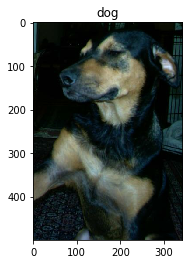

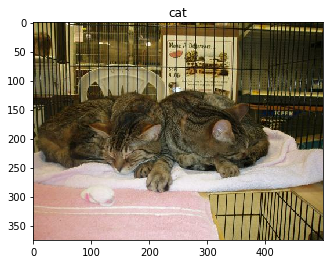

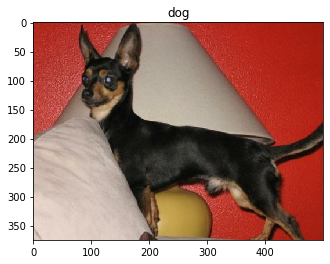

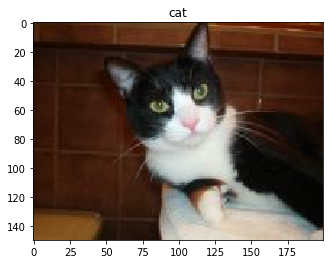

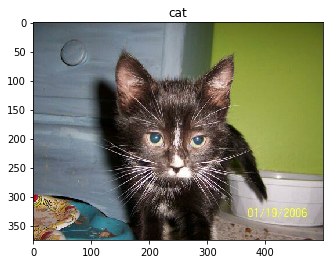

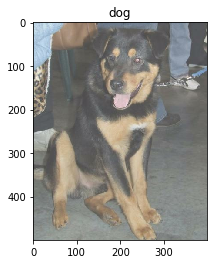

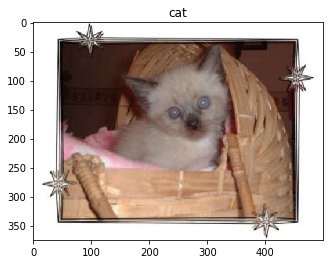

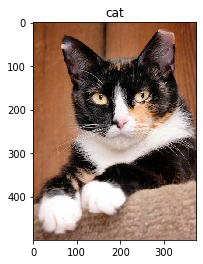

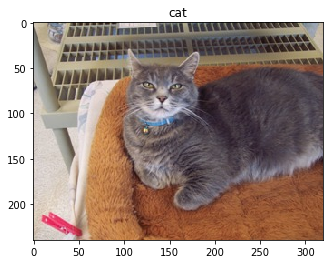

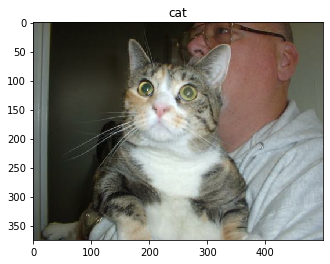

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline
get_label_name = metadata.features['label'].int2str#returns a method that converts integer label into strings
print(type(get_label_name))
for image, label in raw_train.take(10):#Displaying first 10 pics
  plt.figure()
  plt.imshow(image)
  plt.title(get_label_name(label))

**Preprocessing of Data:**

Resizing the images to 160* 160 and normalizing the image channels between -1 and 1

In [0]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
  image = tf.cast(image, tf.float32)#converting the image to 32 bit float
  image = (image/127.5) - 1
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  return image, label

Applying the above function to train, validation and test data using map method:

In [0]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

Shuffling the data and creating a batch

In [0]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)#randomly shuffle element in dataset and create multiple batches in dataset
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print(type(test_batches))

<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>


train_batches, validation_batches and test_batches are objects of BatchDataset class


Cross-verifying that the dimensions of each batch are 32\*160\*160\*3

In [0]:
for image_batch, label_batch in train_batches.take(1):#extracting first batch
  pass

image_batch.shape

TensorShape([32, 160, 160, 3])

### Using the pretrained MobileNet for Transfer Learning


*   MobileNet is pre-trained on Alexnet and directly available in Tensorflow 2.x 
* Various pretrained models are present in [tf.keras.application](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/applications) API 
*  In order to use it, we can split the last few dense layers used for classification  and embed our custom classification layers



In [0]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model MobileNet V2
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False, #It means we do not want the "top-level" classification layers
                                               weights='imagenet')

Let us see how our pretrained base model will convert each image batch of dimensions 32 \* 160 \* 160 \* 3 into an **intermediate feature vector** of size 32 \* 5 \* 5 \* 1280 

In [0]:
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


## 6.1 Feature Extraction Based Transfer Training:
Steps:


*   Freeze the convolution based model and use it only for feature extraction
*   Add a top level classifier and train it



In [0]:
base_model.trainable = False #freezing the base model so that it wont participate in training

Inspecting the architecture of base model

In [0]:
base_model.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 161, 161, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 80, 80, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 80, 80, 32)   128         Conv1[0][0]                      
_______________________________________________________________________________

Adding a top level classification layer

*   First we all add **an average pooling layer** to convert 5 \* 5 \* 1280 feature block for each image into a one dimensional 1280 vector
* This will result in less computation 


In [0]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()#takes the Global Average across Height and Width and gives you a tensor with dimensions of 1xC for an input of H x W x C

Let us see how this newly created layer will transorm the feature batch of dimensions 32 \* 5 \* 5 * 1280 

In [0]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


Adding a classification layer with no activation function:

In [0]:
prediction_layer = tf.keras.layers.Dense(1)
model = tf.keras.Sequential([
  base_model,
  global_average_layer, #newly added global pooling layer
  prediction_layer  #newly added classification layer
])

Compiling the newly created model

In [0]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_160 (Model) (None, 5, 5, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 1281      
Total params: 2,259,265
Trainable params: 1,281
Non-trainable params: 2,257,984
_________________________________________________________________


**Training the model** - First we will assess the model without training it


In [0]:
# Calculating number of images in train, val and test sets
num_train, num_val, num_test = (
  metadata.splits['train'].num_examples*weight/10
  for weight in SPLIT_WEIGHTS
)
initial_epochs = 10
validation_steps = 20#total number of steps or batches after which we will stop

loss0,accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

20/20 [==============================] - 4s 196ms/step - loss: 6.0071 - accuracy: 0.5188


Now, we actually train the last layer(s) of the model and compare the accuracy

In [0]:
initial_epochs = 10
history = model.fit(train_batches,
                    epochs=initial_epochs,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 77s 133ms/step - loss: 2.1074 - accuracy: 0.7419 - val_loss: 0.0000e+00 - val_accuracy: 0.0000e+00
Epoch 2/10
582/582 [==============================] - 72s 124ms/step - loss: 1.1141 - accuracy: 0.8543 - val_loss: 0.8207 - val_accuracy: 0.9121
Epoch 3/10
582/582 [==============================] - 72s 124ms/step - loss: 0.8266 - accuracy: 0.8916 - val_loss: 0.5917 - val_accuracy: 0.9336
Epoch 4/10
582/582 [==============================] - 73s 125ms/step - loss: 0.6936 - accuracy: 0.9079 - val_loss: 0.5414 - val_accuracy: 0.9362
Epoch 5/10
582/582 [==============================] - 73s 126ms/step - loss: 0.6281 - accuracy: 0.9183 - val_loss: 0.4321 - val_accuracy: 0.9448
Epoch 6/10
408/582 [====================>.........] - ETA: 20s - loss: 0.5646 - accuracy: 0.9244

In [0]:
loss0,accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

20/20 [==============================] - 2s 113ms/step - loss: 0.4612 - accuracy: 0.9500


The accuracy by training last layers result in achieving accuracy of above 95%

## **Challenge 6.1** - Transfer Learning
Add an activation function  in the newly added last layer and rebuild and retrain the model  to see its impact. Also change the optimizer algorithm apart from RMS Prop and observe its impact

In [0]:
prediction_layer = tf.keras.layers.Dense(1,)
model = tf.keras.Sequential([
  base_model,
  global_average_layer, #newly added global pooling layer
  prediction_layer  #newly added classification layer
])

## Challenge 6.2 - Transfer Learning
Summarize the main points that you learnt in Transfer Learning through Tensorflow 2.x

In [0]:
'''
Write your points here (between ''')




'''

SyntaxError: ignored

In [0]:
steps_per_epoch = round(num_train)//BATCH_SIZE


### 6.2 Fine Tuning

In [0]:
base_model.trainable = True

NameError: ignored

## 7. TensorBoard
* [Tensorboard](https://www.tensorflow.org/guide/summaries_and_tensorboard) helps us to visualize the architecture of model as well as the training process
* Before Tensorflow 2.x it was not possible to run Tensorboard on Google Colab
* We need to use Callbacks in order to use Tensorboard with Colabs

Let us consider the same example of digit classification and try to explore our model in TensorBoard


In [0]:
import os
#Similar code as above
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0 #normalizing input

# Returns a short sequential model
def create_model():
  model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
  ])
  model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
  return model

Create a log directory where files necessary for TensorBoard will be stored

In [0]:
import datetime
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


Create a callback that will be passed during training of the model

In [0]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)#histogram_freq represents the num of epochs histograms for visualizations will be created


Training the model and passing TensorBoard Callback simultaneously

In [0]:
model=create_model()
model.fit(x_train, 
            y_train, 
            epochs=10, 
            validation_data=(x_test, y_test), 
            callbacks=[tensorboard_callback])

Train on 60000 samples, validate on 10000 samples
Epoch 1/10


W0531 05:42:36.455308 140570479085440 callbacks.py:236] Method (on_train_batch_end) is slow compared to the batch update (0.324921). Check your callbacks.


   32/60000 [..............................] - ETA: 13:34 - loss: 2.3847 - accuracy: 0.0312

W0531 05:42:36.478964 140570479085440 callbacks.py:236] Method (on_train_batch_end) is slow compared to the batch update (0.166065). Check your callbacks.


60000/60000 [==============================] - 8s 127us/sample - loss: 0.2876 - accuracy: 0.9168 - val_loss: 0.1320 - val_accuracy: 0.9600
Epoch 2/10
60000/60000 [==============================] - 7s 118us/sample - loss: 0.1393 - accuracy: 0.9584 - val_loss: 0.1004 - val_accuracy: 0.9692
Epoch 3/10
60000/60000 [==============================] - 7s 118us/sample - loss: 0.1023 - accuracy: 0.9691 - val_loss: 0.0927 - val_accuracy: 0.9703
Epoch 4/10
60000/60000 [==============================] - 7s 118us/sample - loss: 0.0848 - accuracy: 0.9736 - val_loss: 0.0767 - val_accuracy: 0.9759
Epoch 5/10
60000/60000 [==============================] - 8s 128us/sample - loss: 0.0731 - accuracy: 0.9769 - val_loss: 0.0729 - val_accuracy: 0.9791
Epoch 6/10
60000/60000 [==============================] - 8s 132us/sample - loss: 0.0626 - accuracy: 0.9796 - val_loss: 0.0698 - val_accuracy: 0.9785
Epoch 7/10
60000/60000 [==============================] - 8s 125us/sample - loss: 0.0576 - accuracy: 0.9809 - v

Ensure by opening File section that actually log files are created for TensorBoard

**Opening Tensorboard in Colab**

In [0]:
%load_ext tensorboard.notebook
%tensorboard --logdir logs

## 8. Deploying a model using TensorFlow Serving


*   A TensorFlow model can be deployed using Tensorflow Serving
*   However the model must first be converted into SavedModel format
*   Tensorflow serving provides a URL endpoint using which anyone can make a POST request
* The request will yeild a  JSON response of what the model has inferred without having to worry about its technicalities

Installing necessary packages


In [0]:
!echo "deb [arch=amd64] http://storage.googleapis.com/tensorflow-serving-apt stable tensorflow-model-server tensorflow-model-server-universal" | sudo tee /etc/apt/sources.list.d/tensorflow-serving.list && \
apt-get install curl
!curl https://storage.googleapis.com/tensorflow-serving-apt/tensorflow-serving.release.pub.gpg | sudo apt-key add -
!apt-get update && apt-get install tensorflow-model-server

deb [arch=amd64] http://storage.googleapis.com/tensorflow-serving-apt stable tensorflow-model-server tensorflow-model-server-universal
Reading package lists... Done
Building dependency tree       
Reading state information... Done
curl is already the newest version (7.58.0-2ubuntu3.7).
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 6 not upgraded.
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  2343  100  2343    0     0   108k      0 --:--:-- --:--:-- --:--:--  108k
OK
Get:1 http://storage.googleapis.com/tensorflow-serving-apt stable InRelease [3,012 B]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease [3,609 B]
Hit:3 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:4 http://storage.google

We want to serve digit classification model that we created earlier using TF Serving

In [0]:
#Similar code as above
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)
x_train, x_test = x_train / 255.0, x_test / 255.0 #normalizing input
print(x_test.shape)

# Returns a short sequential model
def create_model():
  model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28,1)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, activation='softmax')
  ])
  model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
  return model
model=create_model()
model.fit(x_train, 
            y_train, 
            epochs=5, 
            validation_data=(x_test, y_test))

(10000, 28, 28, 1)
Train on 60000 samples, validate on 10000 samples
Epoch 1/5
60000/60000 [==============================] - 7s 122us/sample - loss: 0.2976 - accuracy: 0.9139 - val_loss: 0.1493 - val_accuracy: 0.9584
Epoch 2/5
60000/60000 [==============================] - 8s 127us/sample - loss: 0.1453 - accuracy: 0.9571 - val_loss: 0.1048 - val_accuracy: 0.9686
Epoch 3/5
60000/60000 [==============================] - 7s 123us/sample - loss: 0.1086 - accuracy: 0.9670 - val_loss: 0.0917 - val_accuracy: 0.9730
Epoch 4/5
60000/60000 [==============================] - 7s 118us/sample - loss: 0.0909 - accuracy: 0.9720 - val_loss: 0.0786 - val_accuracy: 0.9754
Epoch 5/5
60000/60000 [==============================] - 7s 117us/sample - loss: 0.0744 - accuracy: 0.9771 - val_loss: 0.0758 - val_accuracy: 0.9751


We need to export model in **SavedModel** format

In [0]:
# Saving the tf.keras model in SavedModel format
import tempfile
import os

MODEL_DIR = tempfile.gettempdir()
version = 1
export_path = os.path.join(MODEL_DIR, str(version))
print('export_path = {}\n'.format(export_path))
if os.path.isdir(export_path):
  print('\nAlready saved a model, cleaning up\n')
  !rm -r {export_path}

tf.keras.experimental.export_saved_model(model, export_path)

print('\nSaved model:')
!ls -l {export_path}


export_path = /tmp/1



W0531 05:49:22.988355 140570479085440 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/saved_model/signature_def_utils_impl.py:253: build_tensor_info (from tensorflow.python.saved_model.utils_impl) is deprecated and will be removed in a future version.
Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.utils.build_tensor_info or tf.compat.v1.saved_model.build_tensor_info.
W0531 05:49:22.990130 140570479085440 tf_logging.py:161] Export includes no default signature!
W0531 05:49:23.469526 140570479085440 tf_logging.py:161] Export includes no default signature!



Saved model:
total 276
drwxr-xr-x 2 root root   4096 May 31 05:49 assets
-rw-r--r-- 1 root root 270908 May 31 05:49 saved_model.pb
drwxr-xr-x 2 root root   4096 May 31 05:49 variables


Reload the **SavedModel** to ensure it works correctly

In [0]:
import numpy as np
restored_saved_model = tf.keras.experimental.load_from_saved_model(export_path)
predicted_digit=np.argmax(restored_saved_model.predict(np.expand_dims(x_test[15],axis=0)))#actual label is 5
print(predicted_digit)
print((np.expand_dims(x_test[15],axis=0)).shape)

5
(1, 28, 28, 1)


**The model must be stored on the server and following commands must be executed on the Terminal of the server**. However, for the sake of lab we will be demonstrating these commands on Colab itself.

This is where we start running TensorFlow Serving and load our model. After it loads we can start making inference requests using REST. There are some important parameters:

* rest_api_port: The port that you'll use for REST requests.
* model_name: You'll use this in the URL of REST requests. It can be anything.
* model_base_path: This is the path to the directory where you've saved your model.

In [0]:
import os
os.environ["MODEL_DIR"] = MODEL_DIR #path_to_saved_model without the version number

In [0]:
%%bash --bg 
nohup tensorflow_model_server \
  --rest_api_port=8501 \
  --model_name=digit_classification_model \
  --model_base_path="${MODEL_DIR}" >server.log 2>&1

Starting job # 0 in a separate thread.


In [0]:
!tail server.log #to check whether Tensorflow serve has been properly started

2019-05-21 10:57:23.003452: I external/org_tensorflow/tensorflow/cc/saved_model/reader.cc:54] Reading meta graph with tags { serve }
2019-05-21 10:57:23.005797: I external/org_tensorflow/tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2019-05-21 10:57:23.014483: I external/org_tensorflow/tensorflow/cc/saved_model/loader.cc:182] Restoring SavedModel bundle.
2019-05-21 10:57:23.021882: I external/org_tensorflow/tensorflow/cc/saved_model/loader.cc:132] Running initialization op on SavedModel bundle.
2019-05-21 10:57:23.023485: I external/org_tensorflow/tensorflow/cc/saved_model/loader.cc:285] SavedModel load for tags { serve }; Status: success. Took 23543 microseconds.
2019-05-21 10:57:23.023533: I tensorflow_serving/servables/tensorflow/saved_model_warmup.cc:101] No warmup data file found at /tmp/1/assets.extra/tf_serving_warmup_requests
2019-05-21 10:57:23.023670: I tensorflow_serving/core/lo

We want to predict the label of 15th test image

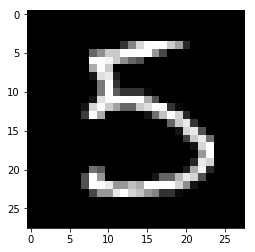

5


In [0]:
import matplotlib.pyplot as plt
plt.imshow(x_test[15].reshape(28,28))
test_img=np.expand_dims(x_test[15],axis=0)#converting image to appropriate format
plt.gray()
plt.show()
print(y_test[15])#label of the image

**Make REST Requests**

We'll send a predict request as a POST to our server's REST endpoint. The URL format follows:
* `POST http://host:port/v1/models/${MODEL_NAME}[/versions/${MODEL_VERSION}]:predict`

`/versions/${MODEL_VERSION}` is optional. If omitted status for all versions is returned in the response.

#### Request format
The request body for predict API must be JSON object formatted as follows:

```
{
  // (Optional) Serving signature to use.
  // If unspecifed default serving signature is used.
  "signature_name": <string>,

  // Input Tensors in row ("instances") or columnar ("inputs") format.
  // A request can have either of them but NOT both.
  "instances": <value>|<(nested)list>|<list-of-objects>
  "inputs": <value>|<(nested)list>|<object>
}
```

Ref: https://www.tensorflow.org/tfx/serving/api_rest#predict_api

In [0]:
import json
data = json.dumps({"signature_name": "serving_default", "instances": test_img.tolist()})
print(data)

{"signature_name": "serving_default", "instances": [[[[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0]], [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0]], [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0]], [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0]], [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0.2], [0.5176470588235295], [0.8392156862745098], [0.9921568627450981

In [0]:
!pip install -q requests

import requests
headers = {"content-type": "application/json"}
json_response = requests.post('http://localhost:8501/v1/models/digit_classification_model:predict', data=data, headers=headers)
predictions = json.loads(json_response.text)['predictions']#convert json into python dictionary
print(np.argmax(predictions))#The predicted output must be 5

5


## 9. Tensorflow Hub


*   **[Tensorflow Hub](https://tfhub.dev/)** is a library and repository for reusing machine learning components
*   We can use Tensorflow Hub to reuse models trained on large amounts of data
* Tensorflow Hub consists of pretrained building blocks called **modules**
* The Tensorflow Hub modules are self contained (without any dependency) and independent of their original source code
* To load a Tensorflow Hub model use **hub.load()**
* To extend a Tensorflow Hub model use **hub.KerasLayer**


## 9.1 Creating a Text Classification Model Using Tensorflow Hub


*   We will be using **[IMDB Dataset ](https://www.tensorflow.org/datasets/datasets#imdb_reviews)** available on Tensorflow Datasets

**Let us first start with installing latest version of Tensorflow Hub and setting up the environment**




In [0]:
 !pip install tensorflow==1.14 #the current GPU based version of Tensorflow 2 is not working with Tensorflow Hub

     |████████████████████████████████| 109.2MB 38.0MB/s 
     |████████████████████████████████| 3.2MB 24.4MB/s 
  Found existing installation: tensorboard 1.13.1
    Uninstalling tensorboard-1.13.1:
      Successfully uninstalled tensorboard-1.13.1
  Found existing installation: tensorflow 1.14.0rc1
    Uninstalling tensorflow-1.14.0rc1:
      Successfully uninstalled tensorflow-1.14.0rc1


In [0]:
!pip install "tensorflow-hub>=0.3"
#all the below modules have  already imported earlier
from __future__ import absolute_import, division, print_function

import numpy as np

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

**Loading the dataset**

In [0]:
train_data, test_data = tfds.load(name="imdb_reviews", split=["train", "test"], 
                                  batch_size=-1, as_supervised=True)#here batch_size=-1 means all data will be returned as single batch

train_examples, train_labels = tfds.as_numpy(train_data)
test_examples, test_labels = tfds.as_numpy(test_data)

W0624 07:56:27.572201 140575788697472 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_datasets/core/file_format_adapter.py:209: tf_record_iterator (from tensorflow.python.lib.io.tf_record) is deprecated and will be removed in a future version.
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


W0624 07:57:26.313067 140575788697472 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_datasets/core/dataset_builder.py:381: DatasetV1.output_shapes (from tensorflow.python.data.ops.dataset_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.


Dataset imdb_reviews downloaded and prepared to /root/tensorflow_datasets/imdb_reviews/plain_text/0.1.0. Subsequent calls will reuse this data.


**Explore the Data**


*   Review with label 0 is considered to be positive
*   Review with label 1 is considered to be negative



In [0]:
print("Training entries: {}, test entries: {}".format(len(train_examples), len(test_examples)))
train_examples[:10]#first 10 examples.
train_labels[:10]#print the first 10 labels

Training entries: 25000, test entries: 25000


array([0, 1, 1, 1, 0, 1, 1, 1, 1, 1])

**Extending the model using Tensorflow Hub**

* We will extend the model already available on Tensorflow Hub via  hub.KerasLayer
* We will be our model using a text embedding model available via Tensorflow Hub
* https://tfhub.dev/google/tf2-preview/gnews-swivel-20dim/1
* Creating an embedding layer using above model

In [0]:
model = "https://tfhub.dev/google/tf2-preview/gnews-swivel-20dim/1"
hub_layer = hub.KerasLayer(model, output_shape=[20], input_shape=[], 
                           dtype=tf.string, trainable=True)

W0624 07:57:59.563764 140575788697472 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


**How embedding layer modifies the input**

In [0]:
print(train_examples[:3])

print(hub_layer(train_examples[:3]))

[b'Just because someone is under the age of 10 does not mean they are stupid. If your child likes this film you\'d better have him/her tested. I am continually amazed at how so many people can be involved in something that turns out so bad. This "film" is a showcase for digital wizardry AND NOTHING ELSE. The writing is horrid. I can\'t remember when I\'ve heard such bad dialogue. The songs are beyond wretched. The acting is sub-par but then the actors were not given much. Who decided to employ Joey Fatone? He cannot sing and he is ugly as sin.<br /><br />The worst thing is the obviousness of it all. It is as if the writers went out of their way to make it all as stupid as possible. Great children\'s movies are wicked, smart and full of wit - films like Shrek and Toy Story in recent years, Willie Wonka and The Witches to mention two of the past. But in the continual dumbing-down of American more are flocking to dreck like Finding Nemo (yes, that\'s right), the recent Charlie & The Choco

**Creating the extended model**

In [0]:
model = tf.keras.Sequential()
model.add(hub_layer)
model.add(tf.keras.layers.Dense(16, activation='relu'))
model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

model.summary()

**Compiling the model**

In [0]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

**Training the model**

In [0]:
history = model.fit(train_examples,
                    train_labels,
                    epochs=40,
                    batch_size=512)

Epoch 1/40
25000/25000 [==============================] - 4s 166us/sample - loss: 1.2406 - accuracy: 0.5065
Epoch 2/40
25000/25000 [==============================] - 4s 162us/sample - loss: 0.6942 - accuracy: 0.5405
Epoch 3/40
25000/25000 [==============================] - 4s 165us/sample - loss: 0.6580 - accuracy: 0.6061
Epoch 4/40
25000/25000 [==============================] - 4s 165us/sample - loss: 0.6212 - accuracy: 0.6606
Epoch 5/40
25000/25000 [==============================] - 4s 165us/sample - loss: 0.5789 - accuracy: 0.7063
Epoch 6/40
25000/25000 [==============================] - 4s 167us/sample - loss: 0.5319 - accuracy: 0.7498
Epoch 7/40
25000/25000 [==============================] - 4s 175us/sample - loss: 0.4826 - accuracy: 0.7854
Epoch 8/40
25000/25000 [==============================] - 4s 171us/sample - loss: 0.4340 - accuracy: 0.8136
Epoch 9/40
20992/25000 [========================>.....] - ETA: 0s - loss: 0.3864 - accuracy: 0.8387

## Solution: 1.3

In [0]:
import tensorflow_datasets as tfds
print(tfds.list_builders())

['abstract_reasoning', 'bair_robot_pushing_small', 'caltech101', 'cats_vs_dogs', 'celeb_a', 'celeb_a_hq', 'chexpert', 'cifar10', 'cifar100', 'cifar10_corrupted', 'clevr', 'cnn_dailymail', 'coco2014', 'colorectal_histology', 'colorectal_histology_large', 'cycle_gan', 'diabetic_retinopathy_detection', 'dsprites', 'dtd', 'dummy_dataset_shared_generator', 'dummy_mnist', 'emnist', 'fashion_mnist', 'flores', 'glue', 'groove', 'higgs', 'horses_or_humans', 'image_label_folder', 'imagenet2012', 'imagenet2012_corrupted', 'imdb_reviews', 'iris', 'kmnist', 'lm1b', 'lsun', 'mnist', 'moving_mnist', 'multi_nli', 'nsynth', 'omniglot', 'open_images_v4', 'oxford_flowers102', 'oxford_iiit_pet', 'para_crawl', 'quickdraw_bitmap', 'rock_paper_scissors', 'shapes3d', 'smallnorb', 'squad', 'starcraft_video', 'sun397', 'svhn_cropped', 'ted_hrlr_translate', 'ted_multi_translate', 'tf_flowers', 'titanic', 'ucf101', 'voc2007', 'wikipedia', 'wmt14_translate', 'wmt15_translate', 'wmt16_translate', 'wmt17_translate',

In [0]:
SPLIT_WEIGHTS = (8, 1, 1)#Splitting the dataset into Train, Test and Split
splits = tfds.Split.TRAIN.subsplit(weighted=SPLIT_WEIGHTS)
(raw_train, raw_validation, raw_test), metadata = tfds.load(name="horses_or_humans", 
                                                            with_info=True,
                                                            split=list(splits),
# as_supervised: `bool`, if `True`, the returned `tf.data.Dataset`
# will have a 2-tuple structure `(input, label)`                                                            
                                                            as_supervised=True)

In [0]:
print(metadata)

tfds.core.DatasetInfo(
    name='horses_or_humans',
    version=1.0.0,
    description='A large set of images of horses and humans.',
    urls=['http://laurencemoroney.com/horses-or-humans-dataset'],
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2)
    },
    total_num_examples=1283,
    splits={
        'test': <tfds.core.SplitInfo num_examples=256>,
        'train': <tfds.core.SplitInfo num_examples=1027>
    },
    supervised_keys=('image', 'label'),
    citation='"""
        @ONLINE {horses_or_humans,
        author = "Laurence Moroney",
        title = "Horses or Humans Dataset",
        month = "feb",
        year = "2019",
        url = "http://laurencemoroney.com/horses-or-humans-dataset"
        }
        
    """',
    redistribution_info=,
)



In [0]:
IMG_SIZE = 128
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
def format_example(image, label):
    print("Format example called!")
    image = tf.cast(image, tf.float32)
    image = image / 255.0
    # Resize the image if required
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

Format example called!
Format example called!
Format example called!


In [0]:
SHUFFLE_BUFFER_SIZE = 1024
BATCH_SIZE = 32

train = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation = validation.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)
# (Optional) prefetch will enable the input pipeline to asynchronously fetch batches while
# your model is training.
train = train.prefetch(tf.data.experimental.AUTOTUNE)
print(train)
print(validation)
print(test)

<PrefetchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>
<BatchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>
<BatchDataset shapes: ((None, 128, 128, 3), (None,)), types: (tf.float32, tf.int64)>


(128, 128, 3)
0.0
1.0


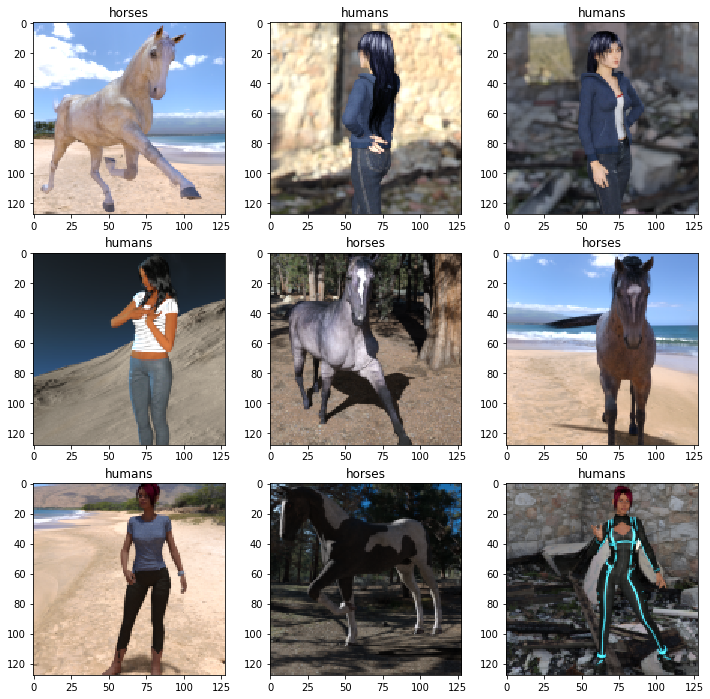

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
# Get the function which converts label indices to string
get_label_name = metadata.features['label'].int2str
plt.figure(figsize=(12,12)) 
for batch in train.take(1):
    for i in range(9):
        image, label = batch[0][i], batch[1][i]
        plt.subplot(3,3,i+1)
        plt.imshow(image.numpy())
        plt.title(get_label_name(label.numpy()))
        plt.grid(False)
print(image.shape)
print(np.min(image))
print(np.max(image))

In [0]:
# Creating a simple CNN model in tf.keras using functional API
def create_model():
  model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
  tf.keras.layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dense(metadata.features['label'].num_classes, activation='softmax')
  ])
  return model
num_train, num_val, num_test = (metadata.splits['train'].num_examples * weight/10 for weight in SPLIT_WEIGHTS)
steps_per_epoch = round(num_train)//BATCH_SIZE
validation_steps = round(num_val)//BATCH_SIZE
model = create_model()

In [0]:
model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
model.summary()
model.fit(train.repeat(), epochs=5,  steps_per_epoch=steps_per_epoch, validation_data=validation.repeat(), validation_steps=validation_steps,)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            multiple                  896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 multiple                  0         
_________________________________________________________________
conv2d_4 (Conv2D)            multiple                  18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 multiple                  0         
_________________________________________________________________
conv2d_5 (Conv2D)            multiple                  36928     
_________________________________________________________________
flatten_1 (Flatten)          multiple                  0         
_________________________________________________________________
dense_2 (Dense)              multiple                 



---

